# My LA Footprint
After coming across this [Beneath Data blogpost](http://beneathdata.com/how-to/visualizing-my-location-history/), I thought it would be interesting to take a look at my own location data within Los Angeles to get a sense for how well I know different neighborhoods. [Others](http://www.juanshishido.com/locationhistoryhex.html) have done the same, but I haven't seen any with a Los Angeles map (yet). The big difference this time around is that I can take advantage of the GeoPandas library, which I am guessing was not yet available when the original blog post was written.

This tutorial will mostly follow the steps from the original Beneat Data blogpost, with some differences in the use of GeoPandas when appropriate.

### Extract: Get your location history via Google takeout
1. Go to https://www.google.com/settings/takeout and uncheck all services except "Location History."
2. When Google finishes creating the archive, download and unzip the file, which should be called "LocationHistory.json"

In [2]:
##### Setup
%matplotlib inline
import json
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import pysal as ps
import matplotlib.pyplot as plt
import datetime
import folium

##### About Google Location History
Google provides your location history data in a json format that includes the following fields:
* timestamp, in Ms ("timestampMs")
* latitude, multiplied by 10^7 ("latitudeE7")
* longitude, multiplied by 10^7 ("longitudeE7")
* accuracy score ("accuracy"): the confidence of Google's guess in your location. I'm not sure about the scale of the confidence score.
* altitude ("altitude")
* activitity ("activity"): Not present in every record, but if so, a dictionary that includes the following:
* timestamp ("timestampMS"): another timestamp value
*  activity ("activity"): a dictionary that includes possible activities ("types") along with Google's confidence that you are doing each one ("confidence"). The types of activity include "Still", "On_Foot", "In_Vehicle", "On_Bicycle", "Unknown", "Walking", "Running". The confidence scores do not add up to 100.

You can see below what the JSON data looks like:


In [3]:
# Load the file, print first five timestamps
with open('Takeout/Location_History/Location_History.json', 'r') as fh:
    data = json.loads(fh.read())

for i in range(0,5):
    print data['locations'][i]

{u'latitudeE7': 340515456, u'accuracy': 21, u'longitudeE7': -1182430915, u'altitude': 87, u'timestampMs': u'1499374838988'}
{u'latitudeE7': 340515456, u'accuracy': 21, u'longitudeE7': -1182430915, u'altitude': 87, u'timestampMs': u'1499374720149'}
{u'latitudeE7': 340515727, u'accuracy': 21, u'longitudeE7': -1182431029, u'altitude': 87, u'timestampMs': u'1499374478949'}
{u'latitudeE7': 340515727, u'accuracy': 21, u'longitudeE7': -1182431029, u'altitude': 87, u'timestampMs': u'1499374418822'}
{u'latitudeE7': 340515727, u'accuracy': 21, u'longitudeE7': -1182431029, u'altitude': 87, u'timestampMs': u'1499374320749'}


### Load: Read the json file into a GeoDataFrame
For this piece of the project, I needed to transform the Google Location History JSON file into a usable GeoPandas GeoDataFrame. 

In [45]:
with open('Takeout/Location_History/Location_History.json', 'r') as fh:
    data = json.loads(fh.read())

locations = data['locations']
print len(locations)

def generate_locations(locations):
    
    # Create a new dictionary ('loc') that will contain the transformed data
    # that we will use to create the new GeoDataFrame
    for loc in locations:
        
        # Create a shapely point object from the lat / lon coords
        loc['lon'] = loc['longitudeE7'] * 0.0000001
        loc['lat'] = loc['latitudeE7'] * 0.0000001
        loc['geometry'] = Point(loc['lon'], loc['lat'])
        
        # Convert timestamp from ms to s, create datetime object
        loc['timestampSec'] = int(loc['timestampMs']) * 0.001
        loc['datetime'] = datetime.datetime.fromtimestamp(loc['timestampSec']).strftime('%Y-%m-%d %H:%M:%S')
        
        # If activity is present, assign most likely activity to timestamp
        try:
            activities = loc['activity'][0]['activity']
            
            # Pick the activity with the highest probability
            maxConfidenceActivity = max(activities, key=lambda x:x['confidence'])
            loc['conf'] = maxConfidenceActivity['confidence']
            loc['activity'] = maxConfidenceActivity['type']
        
        except:
            loc['conf'] = None
            loc['activity'] = None

        yield loc

formatted_loc = generate_locations(locations)

google_loc = gpd.GeoDataFrame(generate_locations(locations))
google_loc = google_loc.drop(['velocity','latitudeE7','longitudeE7','timestampMs','heading'],axis=1)
google_loc.crs = {'init':'epsg:4326'}
google_loc[google_loc['activity'] == 'ON_BICYCLE'].head()

193047
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}

{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'

{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'conf

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'co

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}

[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNO

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UN

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u

[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNO

{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'ST

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'O

{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, 

{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'S

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 50, u'type': u'UNKNOWN'}, {u'confidence': 36, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_FOOT'}, {u'confidence': 2, u'type': u'ON_BICYCLE'}, {u'confidence': 2, u'type': u'STILL'}, {u'confidence': 2, u'type': u'WALKING'}, {u'confidence': 2, u'type': u'RUNNING'}]
{u'confidence': 50, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UN

[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UN

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALK

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALK

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNO

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type

[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence':

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WA

{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[

{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 

{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOW

[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'c

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {

{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALK

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u

{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'

{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOW

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKIN

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNI

{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u

{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type':

{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type'

{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type':

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STI

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u

{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN

[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALK

{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'ty

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKIN

[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': 

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'U

[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u

{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type':

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALK

{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'conf

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ST

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'

[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALK

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'O

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BI

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL

{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {

[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type':

[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKIN

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'ON_BICYCLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'ON_BICYCLE'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': 

[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'IN_VEHICLE'}
[{u'confidence': 75, u'type': u'IN_VEHICLE'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNO

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BI

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{

{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 80, u'type': u'ON_FOOT'}, {u'confidence': 75, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 80, u'type': u'ON_FOOT'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEH

{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNK

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'UNKNOWN'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'STILL'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'UNKNOWN'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type'

[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BICYCLE'}, {u'confidence': 5, u'type': u'UNKNOWN'}, {u'confidence': 5, u'type': u'WALKING'}, {u'confidence': 5, u'type': u'RUNNING'}]
{u'confidence': 75, u'type': u'STILL'}
[{u'confidence': 75, u'type': u'STILL'}, {u'confidence': 10, u'type': u'ON_FOOT'}, {u'confidence': 5, u'type': u'IN_VEHICLE'}, {u'confidence': 5, u'type': u'ON_BI

{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 100, u'type': u'TILTING'}]
{u'confidence': 100, u'type': u'TILTING'}
[{u'confidence': 85, u'type': u'STILL'}, {u'confidence': 8, u'type': u'IN_VEHICLE'}, {u'confidence': 8, u'type': u'ON_BICYCLE'}]
{u'confidence': 85, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'confidence': 100, u'type': u'STILL'}
[{u'confidence': 100, u'type': u'STILL'}]
{u'c

,accuracy,activity,altitude,conf,datetime,geometry,lat,lon,timestampSec
1113,29,ON_BICYCLE,130.0,75.0,2017-07-05 14:00:08,POINT (-118.2403263 34.0543778),34.054378,-118.240326,1.499288e+09
1919,5,ON_BICYCLE,62.0,75.0,2017-07-04 21:46:58,POINT (-118.2364698 34.061805),34.061805,-118.236470,1.499230e+09
1927,9,ON_BICYCLE,55.0,75.0,2017-07-04 21:30:10,POINT (-118.2319688 34.0586363),34.058636,-118.231969,1.499229e+09
2301,3,ON_BICYCLE,47.0,75.0,2017-07-04 19:31:24,POINT (-118.2374922 34.0506868),34.050687,-118.237492,1.499222e+09
2458,10,ON_BICYCLE,58.0,75.0,2017-07-04 18:44:43,POINT (-118.2367696 34.0458967),34.045897,-118.236770,1.499219e+09


### Transform: Bring in the Neighborhoods and perform Spatial Join
I'm interested in looking at my location history within neighborhoods of LA. The best source for this data is the LA Times [Mapping L.A.](http://maps.latimes.com/about/#the-data) project, which provides data for LA County neighborhoods and LA city neighborhoods in KML / SHP / JSON formats. I went ahead and downloaded the LA city neighborhoods in the shapefile format. I then spatially join my google location GeoDataFrame with the LA neighborhoods GeoDataFrame, which will automatically filter out all the location data that is outside the City of LA.

After joining the shapefile and converting the units into the percentage of time spent in each neighborhood, I can quickly plot a histogram to show this distribution. 

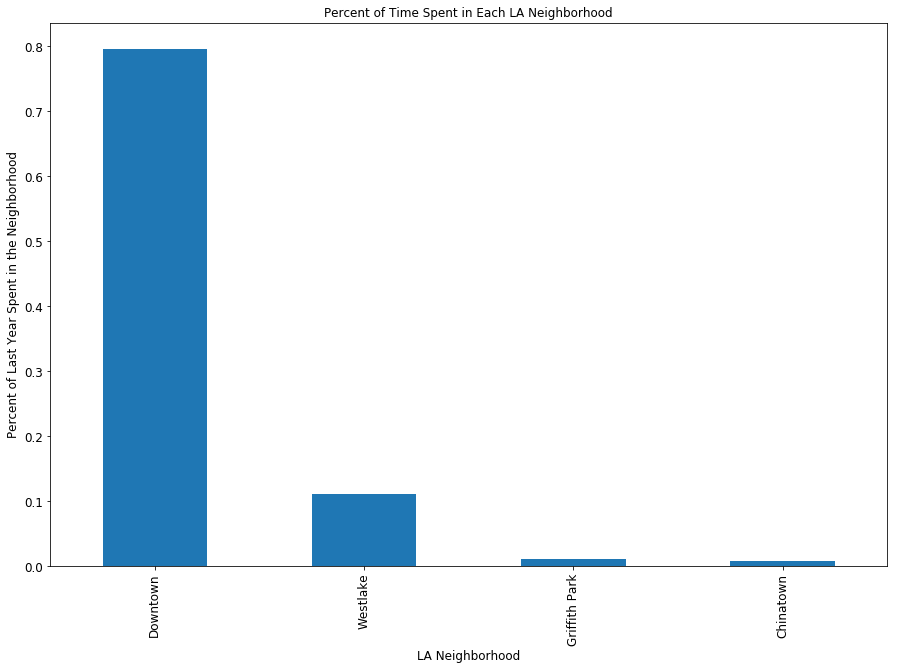

In [35]:
# Read the shapefile 
la_neighborhoods = gpd.read_file('la_neighborhoods/la_city.shp')

# Execute spatial join: all points within LA Neighborhoods
la_loc = gpd.sjoin(google_loc, la_neighborhoods, how='inner', op='intersects')

# Calculate the percentage of time spent in each LA neighborhood & Join to spatial dataframe
neighborhood_percent = (la_loc['Name'].value_counts(dropna=False) / la_loc['Name'].value_counts().sum()).reset_index()
neighborhood_percent.columns = ['Name','Percent']

# Clean up the resulting dataframe
la_neighborhoods = la_neighborhoods.merge(neighborhood_percent, how='left', on='Name')
la_neighborhoods = la_neighborhoods.set_index('Name')
la_neighborhoods = la_neighborhoods.drop('Descriptio', axis=1)

# Plot the bar chart
la_neighborhoods_pct = la_neighborhoods[la_neighborhoods['Percent'] > .008]
barchart = la_neighborhoods_pct['Percent'].sort_values(ascending=False).plot(kind='bar', title='Percent of Time Spent in Each LA Neighborhood', figsize=(15,10), fontsize=12)
barchart.set_xlabel("LA Neighborhood", fontsize=12)
barchart.set_ylabel("Percent of Last Year Spent in the Neighborhood", fontsize=12)
plt.show()

##### Lesson #1: I spent quite a bit of time last year in downtown Los Angeles.
Talk about a skewed distribution! Of the time that I spent in Los Angeles last year (remember, we subsetted out GPS locations that were outside LA through the spatial join), roughly 80 percent of it was spent in downtown Los Angeles. 

However, the histogram should not be that surprising, since I both live and work downtown. Given that I'm sleeping roughly 7 hours a night and at work roughly 9 hours each day, it makes sense that such a large chunk of my time is spent in the downtown area. It also doesnt help that downtown has plenty of places to eat and enjoy happy hours, and a good chunck of my LA friends work downtown, so I end up spending quite a bit of time outside of work / home downtown.

The location with the second most time spent is Westlake, where I moved this year (so I expect the proportion of time spent in this neighborhood to grow over the next year). 

In [ ]:
# Create LA Basemap specifying map center, zoom level, and using default openstreetmap tiles
la_basemap = folium.Map([34.047677, -118.3073917], tiles='Stamen Toner', zoom_start=11)

# Choropleth function adapted from code via Andrew Gaidus
# at http://andrewgaidus.com/leaflet_webmaps_python/
def add_choropleth(mapobj, gdf, id_field, value_field, fill_color = 'YlOrRd', fill_opacity = 0.6, 
                    line_opacity = 0.2, num_classes = 6, classifier = 'Quantiles'):
    
    #Allow for 3 Pysal map classifiers to display data
    #Generate list of breakpoints using specified classification scheme. List of breakpoint will be input to choropleth function
    if classifier == 'Fisher_Jenks':
        threshold_scale=ps.esda.mapclassify.Fisher_Jenks(gdf[value_field], k = num_classes).bins.tolist()
    if classifier == 'Equal_Interval':
        threshold_scale=ps.esda.mapclassify.Equal_Interval(gdf[value_field], k = num_classes).bins.tolist()
    if classifier == 'Quantiles':
        threshold_scale=ps.esda.mapclassify.Quantiles(gdf[value_field], k = num_classes).bins.tolist()
    
    #Call Folium choropleth function, specifying the geometry as a the WGS84 dataframe converted to GeoJSON, the data as 
    #the GeoDataFrame, the columns as the user-specified id field and and value field.
    #key_on field refers to the id field within the GeoJSON string
    mapobj.choropleth(
                geo_str = gdf.to_json(),
                data = gdf,
                columns = [id_field, value_field],
                key_on = 'feature.properties.{}'.format(id_field),
                fill_color = fill_color,
                fill_opacity = fill_opacity,
                line_opacity = line_opacity,
                threshold_scale = threshold_scale
                )
    return mapobj

la_google_history = add_choropleth(la_basemap, la_neighborhoods, "Name", "Percent")

la_google_history